<a href="https://colab.research.google.com/github/Krisss993/GAN/blob/main/26_06_GAN_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

DIFFUSION MODELS
- They define a series of diffusion steps to slowly add random noise to data and then learn to reverse the diffusion process to construct new data samples from noise through thousands of pictures with different combinations of % noises vs % images.

- They can also go from image to another image with adding some noise

- Working with latent space takes less dimensions and data, it also gives more flexibility

In [1]:
# -q - quiet

# tqdm - progress bar
!pip install -q regex tqdm

# diffusers - provides easy access to a lot of pretrained generative models
# transformers - easy working with transfomer architecture
# accelerate - optimizing and improving efficiency of training processes ran with models
!pip install -q diffusers transformers accelerate scipy

# xformers - helps with efficient calculations of transformer models
!pip install -q -U xformers
!pip install -q opencv-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.4/309.4 kB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 53.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 222.7/222.7 MB 6.0 MB/s eta 0:00:00


In [2]:
# Segmentation libraries SAM

# segment-anything
!pip install -q git+https://github.com/facebookresearch/segment-anything.git

# required by segment-anything
!pip install -q pycocotools matplotlib onnxruntime onnx

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 18.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 56.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 11.9 MB/s eta 0:00:00


In [3]:
import torch
from torchvision import transforms
from torchvision.transforms.functional import to_pil_image, to_tensor

import PIL, cv2
from PIL import Image

from io import BytesIO
from IPython.display import display
import base64, json, requests
from matplotlib import pyplot as plt

import numpy as np
import copy

from numpy import asarray

import sys

from segment_anything import sam_model_registry, SamPredictor, SamAutomaticMaskGenerator

In [4]:
### Downloading checkpoint file to same folder where the notebook is
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

--2024-06-26 09:43:23--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.163.189.108, 3.163.189.14, 3.163.189.51, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.163.189.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G   246MB/s    in 12s     

2024-06-26 09:43:35 (196 MB/s) - ‘sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]



In [7]:
# import Stable Diffusion model
# EulerDiscreteScheduler - algorithm of denoising process
from diffusers import StableDiffusionInpaintPipeline, EulerDiscreteScheduler

# The scheduler determine the algorithm used to produce new samples during the denoising process

# choosing specific model from model folder
model_dir = 'stabilityai/stable-diffusion-2-inpainting'

# initializing scheduler, which runs denoising process,
# from_pretrained - because its already pretrained
# subfolder - seting it to folder scheduler
scheduler = EulerDiscreteScheduler.from_pretrained(model_dir, subfolder='scheduler')

# in order to run different diffusions its necessary to form a pipeline with many different steps
# creating pipeline from specific method, setting dir to model_dir, setting scheduler,
# precision floating_point_16_bits
#
pipe = StableDiffusionInpaintPipeline.from_pretrained(model_dir,
                                                      scheduler=scheduler,
                                                      revision="fp16",
                                                      torch_dtype=torch.float16
                                                      )
pipe = pipe.to('cuda')

# makes the execution of transfomers model more efficient
pipe.enable_xformers_memory_efficient_attention

/usr/local/lib/python3.10/dist-packages/diffusers/pipelines/pipeline_loading_utils.py:219: FutureWarning: You are loading the variant fp16 from stabilityai/stable-diffusion-2-inpainting via `revision='fp16'` even though you can load it via `variant=`fp16`. Loading model variants via `revision='fp16'` is deprecated and will be removed in diffusers v1. Please use `variant='fp16'` instead.
  warnings.warn(
unet/diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-2-inpainting/snapshots/76eb2c8bdc2cbaf387603cbae34884c254a05e80/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-2-inpainting/snapshots/76eb2c8bdc2cbaf387603cbae34884c254a05e80/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-2-inpainting/snapshots/76eb2c8bdc2cbaf387603cbae34884c254a05e80/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.ca

<bound method DiffusionPipeline.enable_xformers_memory_efficient_attention of StableDiffusionInpaintPipeline {
  "_class_name": "StableDiffusionInpaintPipeline",
  "_diffusers_version": "0.29.1",
  "_name_or_path": "stabilityai/stable-diffusion-2-inpainting",
  "feature_extractor": [
    "transformers",
    "CLIPFeatureExtractor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": false,
  "safety_checker": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}
>

Source image size: (1280, 960)


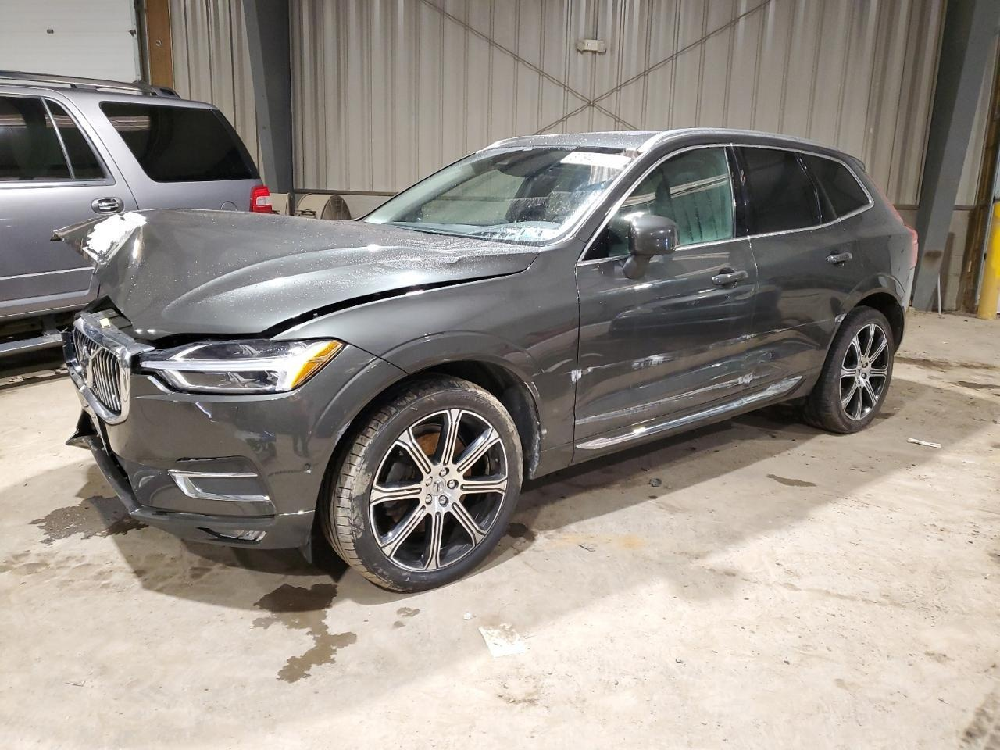

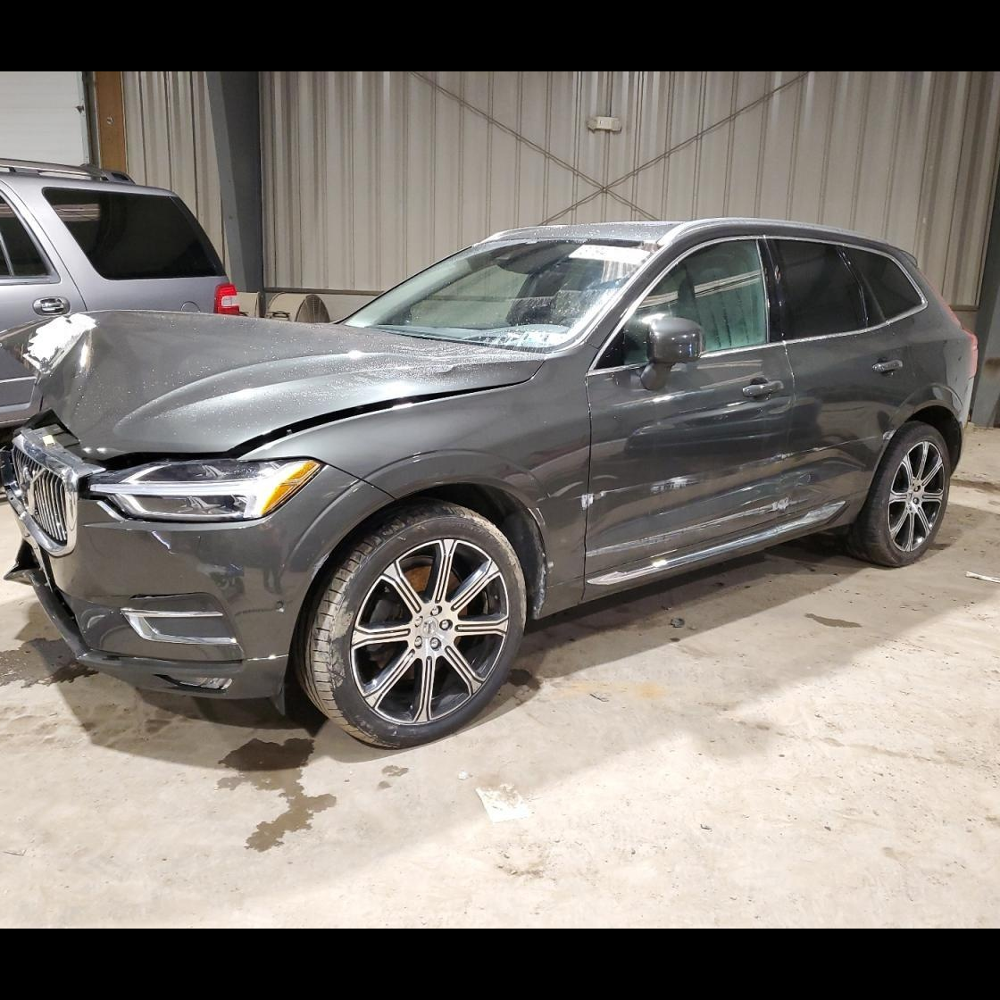

Source image size: (1120, 1120)


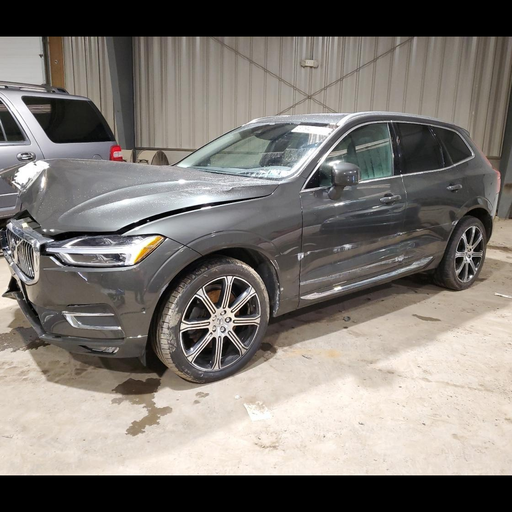

Source image size: (512, 512)


In [20]:
# UPLOAD AND UNSPLASH IMAGE IN THE SAME FOLDER WHERE THE NOTEBOOK IS AND WEIGHS.pth ARE

# resizing image size for lowering memory usage
target_width, target_height = 512, 512

# loading and opening image
source_image = Image.open('XC60.jpg')
width, height = source_image.size
print(f'Source image size: {source_image.size}')
display(source_image)

# making the image square by changing starting pixels - box=(left, upper, right, lower)
source_image = source_image.crop(box=(80, -80, width - 80, height + 80))
display(source_image)
print(f'Source image size: {source_image.size}')

# Resizing image to target size
source_image = source_image.resize((target_width, target_height), Image.LANCZOS)
display(source_image)
print(f'Source image size: {source_image.size}')

# converting image to an array for usage with segmentation model
segmentation_image = asarray(source_image)


In [21]:
# Initialize segment anything model - SAM
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"
device = "cuda"

# initializing SAM model
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

# initializing mask generator
# pred_iou_thresh - the lower the value the more masks it will generate, higher means less masks but higher quality of them
#
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32, #
    pred_iou_thresh=0.99, # intersection over union, creating contours that fit original element, 1 - fits perfectly to the element
    stability_score_thresh=0.99, #
    crop_n_layers=1, #
    crop_n_points_downscale_factor=2, #
    min_mask_region_area=100, # requires open-cv to run post-processing
)


In [23]:
# Running segmentation model
masks = mask_generator.generate(segmentation_image)

# Printing number of masks generated and their keys
print(f'Number of masks generated: {len(masks)}')

# Each of the masks is a dict that has keys, the first element(segmentation) is the mask itself, other are different descriptions of the mask
print(masks[0].keys())

# IOU (intersection over union) tells us the degree of overlap between two boxes
# In the case of object detection and segmentation it referes to the overlap of the Grand Truth and Prediction Region


Number of masks generated: 5
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


In [25]:
# Visualizing the masks

def show_anns(anns):
  if len(anns) == 0:
    return
  # Sorting masks by area in descending order
  sorted_anns = sorted(enumerate(anns), key=lambda x: x[1]['area'], reverse=True)

  #
  ax = plt.gca()

  # disable autosacle to keep the img size consistant
  ax.set_autoscale_on(False)

  # Iterating through each mask and displaying it on top of the original image
  for original_idx, ann in sorted_anns:
    m = ann['segmentation']
    img = np.ones((m.shape[0], m.shape[1], 3))

    # Generating random color for the mask
    color_mask = np.random.random((1,3)).tolist()[0]
    for i in range(3):
      img[:, :, i] = color_mask[i]

    # Blending the mask with the image, using 0.35 as the alpha value for transparency
    ax.imshow(np.dstack((img, m*0.35)))

    # finding contours of the mask and computing centroid
    contours, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
      cnt = contours[0]
      M = cv2.moments(cnt)

      # computing the centroid of the mask if the moment is non zero
      if M['m00'] != 0:
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])

        # Displaying the original index number (1-based) at the centroid of the mask
        # The text is white, bold
        ax.text(cx, cy, str(original_idx), color='white', fontweight='bold', fontsize=16, ha='center', va='center')

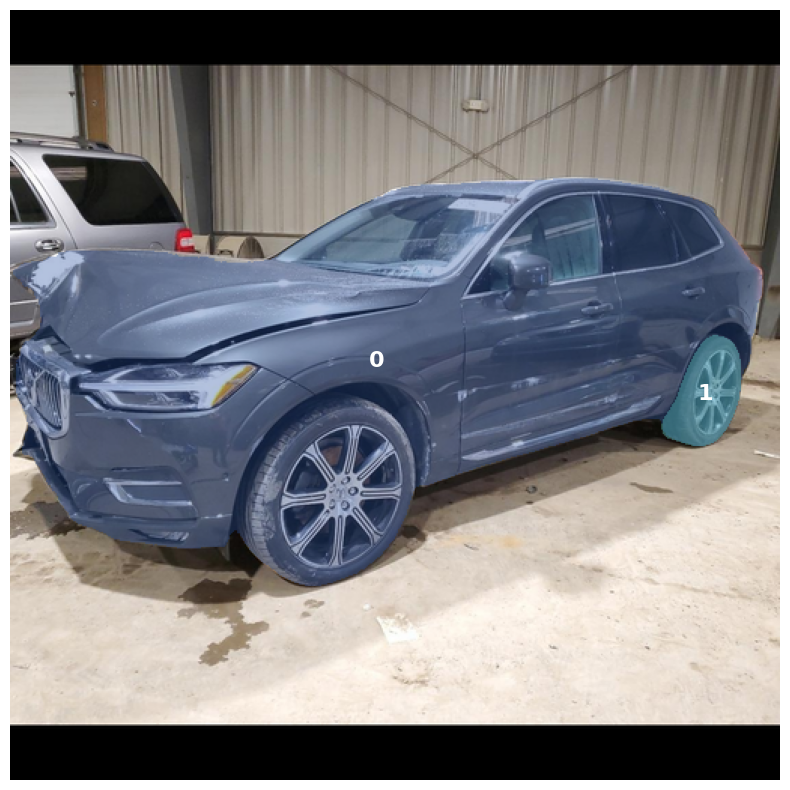

In [31]:
# Displaying masks with idx nr
plt.figure(figsize=(10, 10))
plt.imshow(source_image)
show_anns(masks[:-3]) # -x gives first nr of masks
plt.axis('off')
plt.show()

In [34]:
# Exploring one of the keys of the mask
for i, values in enumerate(masks):
  print(f'{i}: Area: {values["area"]} | IoU: {values["predicted_iou"]}')
  # IoU: 1-perfect overlap, 0-no overlap

0: Area: 90096 | IoU: 1.0430920124053955
1: Area: 2614 | IoU: 0.9989181756973267
2: Area: 18432 | IoU: 0.998130738735199
3: Area: 77601 | IoU: 1.0207645893096924
4: Area: 36874 | IoU: 1.0003656148910522


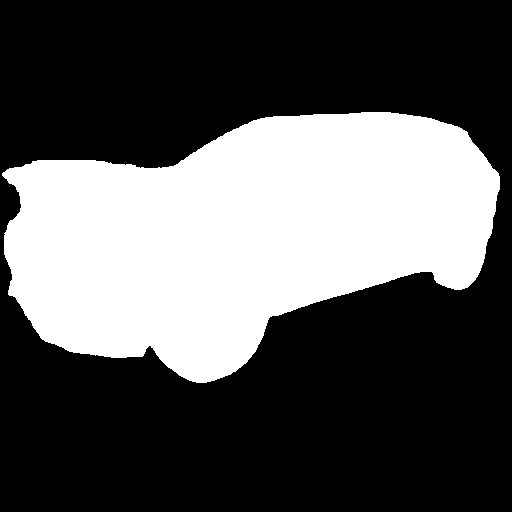

In [35]:
# Deciding which mask to do inpainting with
mask_index = 0

# selecting the mask
segmentation_mask = masks[mask_index]['segmentation']
stable_diffusion_mask = PIL.Image.fromarray(segmentation_mask)
display(stable_diffusion_mask)

In [42]:
def create_image_grid(original_image, images, names, rows, columns):
    names = copy.copy(names)  # Create a copy of the names list to avoid modifying the external variable
    images = copy.copy(images)  # Create a copy of the images list to avoid modifying the external variable

    # Check if images is a tensor
    if torch.is_tensor(images):
        # Check if the number of tensor images and names is equal
        assert images.size(0) == len(names), "Number of images and names should be equal"

        # Check if there are enough images for the specified grid size
        assert images.size(0) >= (rows * columns) - 1 - 1, "Not enough images for the specified grid size"

        # Convert tensor images to PIL images and apply sigmoid normalization
        images = [to_pil_image(torch.sigmoid(img)) for img in images]
    else:
        # Check if the number of PIL images and names is equal
        assert len(images) == len(names), "Number of images and names should be equal"

    # Check if there are enough images for the specified grid size
    assert len(images) >= (rows * columns) - 1 - 1, "Not enough images for the specified grid size"

    # Add the original image to the beginning of the images list
    images.insert(0, original_image)

    # Add an empty name for the original image to the beginning of the names list
    names.insert(0, '')

    # Create a figure with specified rows and columns
    fig, axes = plt.subplots(rows, columns, figsize=(15, 15))

    # Iterate through the images and names
    for idx, (img, name) in enumerate(zip(images, names)):
        # Calculate the row and column index for the current image
        row, col = divmod(idx, columns)

        # Add the image to the grid
        axes[row, col].imshow(img, cmap='gray' if idx > 0 and torch.is_tensor(images) else None)

        # Set the title (name) for the subplot
        axes[row, col].set_title(name)

        # Turn off axes for the subplot
        axes[row, col].axis('off')

    # Iterate through unused grid cells
    for idx in range(len(images), rows * columns):
        # Calculate the row and column index for the current cell
        row, col = divmod(idx, columns)

        # Turn off axes for the unused grid cell
        axes[row, col].axis('off')

    # Adjust the subplot positions to eliminate overlaps
    plt.tight_layout()

    # Display the grid of images with their names
    plt.show()

In [58]:
# setup tranformation masks
num_images_per_prompt = 4
inpainting_prompts = ['volvo xc60 inscription', 'batmobile', 'blue volvo xc90', 'black volvo xc60']

generator = torch.Generator(device="cuda").manual_seed(155) # 155, 77


# Run stable diffusion pipeline in inpainting mode

encoded_images = []
for i in range(num_images_per_prompt):
  image = pipe(prompt=inpainting_prompts[i], generator=generator, image=source_image, mask_image=stable_diffusion_mask).images[0]
  encoded_images.append(image)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

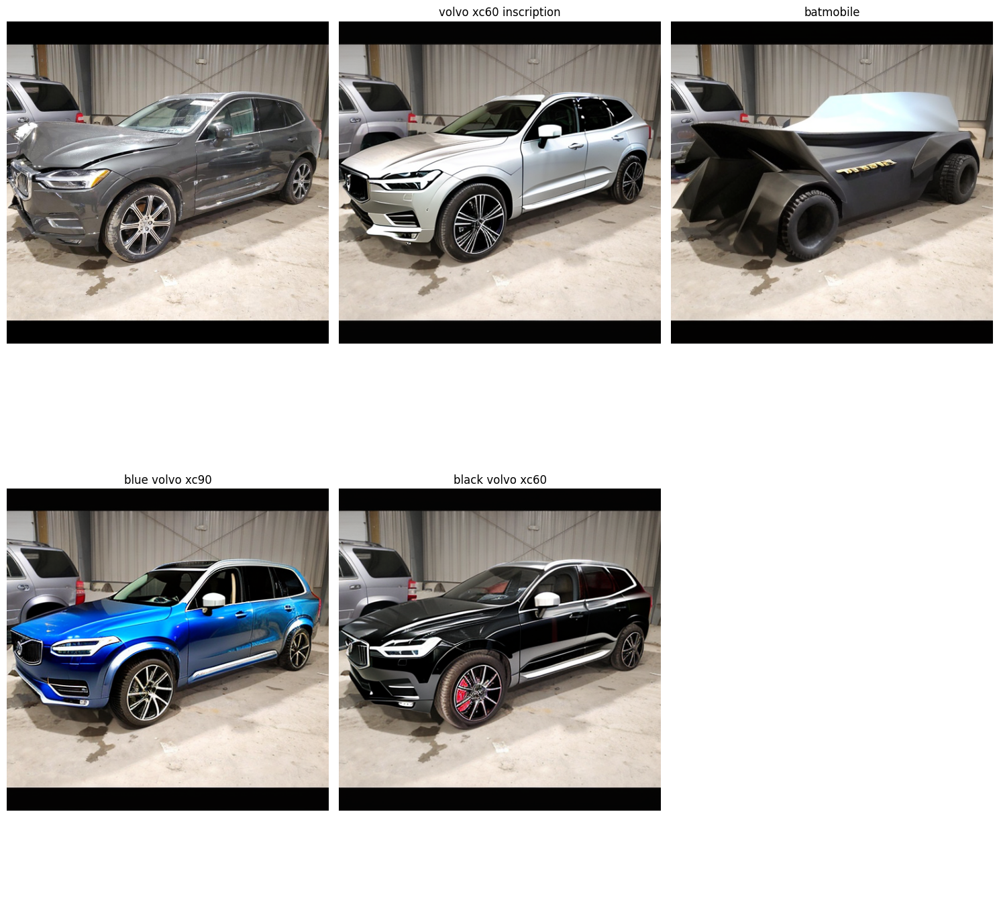

In [59]:
create_image_grid(source_image, encoded_images, inpainting_prompts, 2, 3)

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

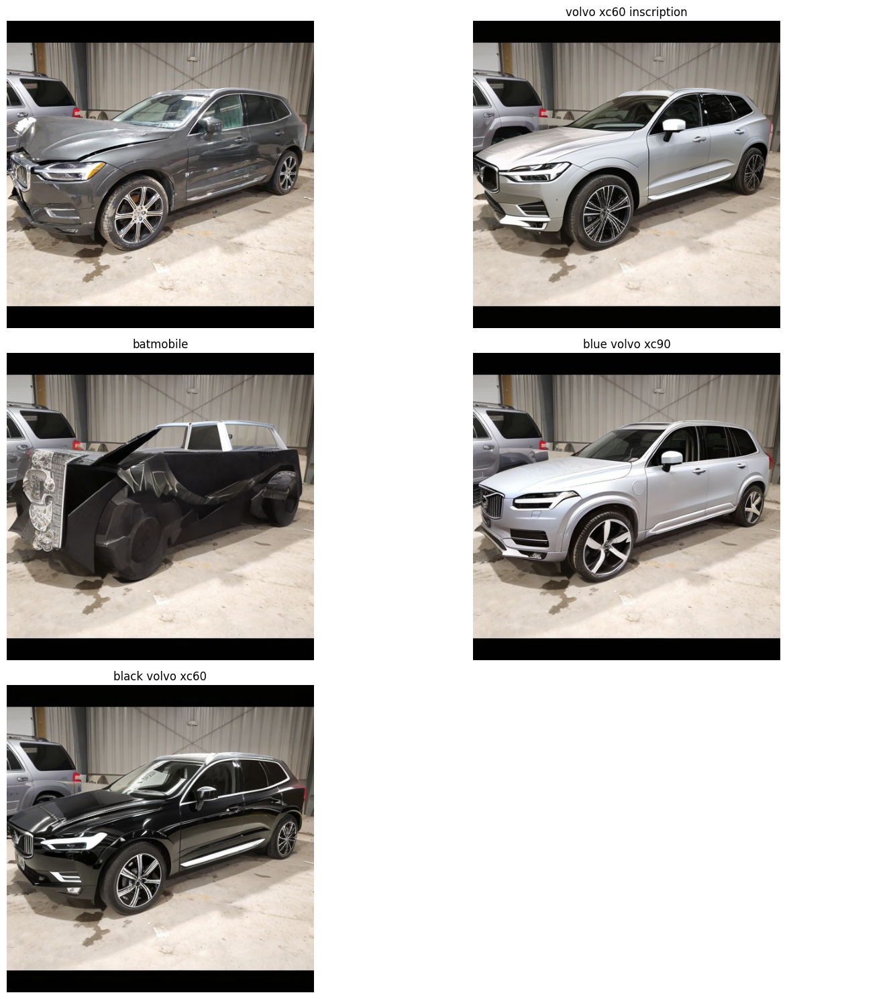

In [61]:
### Setup transformation prompts
num_images_per_prompt = 4
inpainting_prompts = ['volvo xc60 inscription', 'batmobile', 'blue volvo xc90', 'black volvo xc60']

generator = torch.Generator(device="cuda").manual_seed(155) # 155, 77,

### Run Stable Difussion pipeline in inpainting mode
encoded_images = []
for i in range(num_images_per_prompt):
        # num_inference_steps - nr of steps of denoising process, more steps - slower but may be better quality
        # guidance_scale - 7, 8, 9, 10, 12 - below 7 its very creative the more the more similar it is
        image = pipe(prompt=inpainting_prompts[i], guidance_scale=3.5, num_inference_steps=60, generator=generator, image=source_image, mask_image=stable_diffusion_mask).images[0]
        encoded_images.append(image)
create_image_grid(source_image, encoded_images, inpainting_prompts, 3, 2)

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

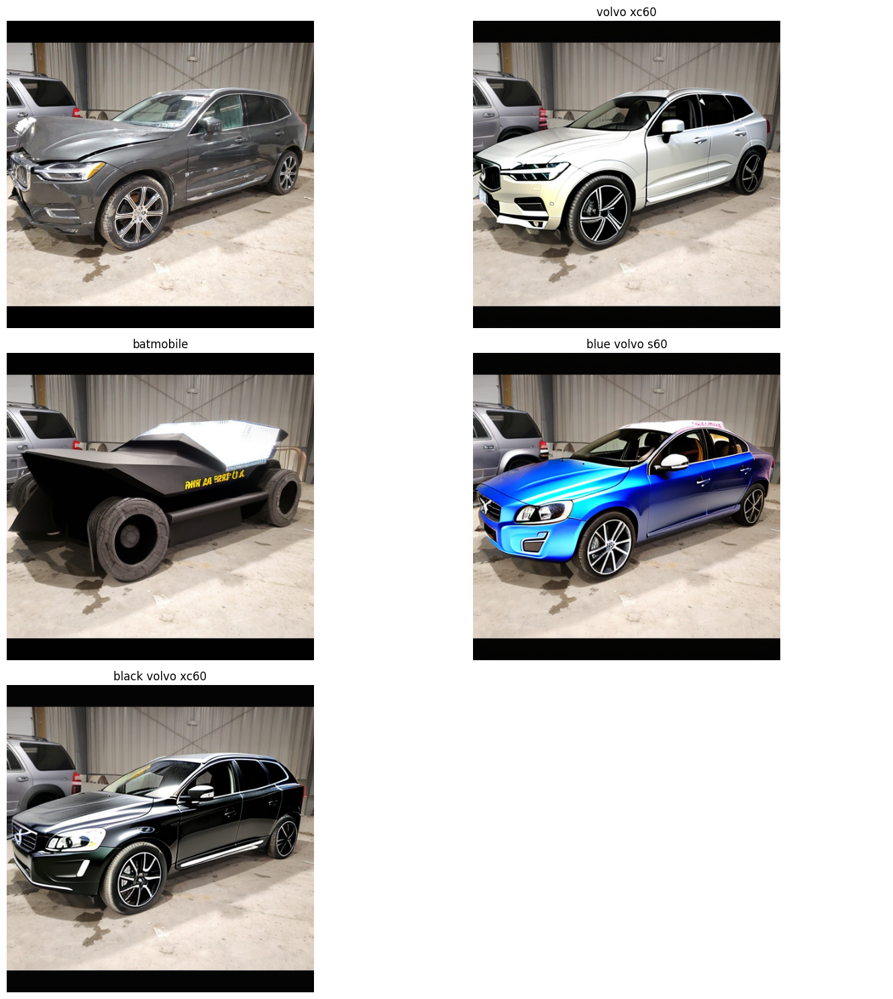

In [65]:
### Setup transformation prompts
num_images_per_prompt = 4
inpainting_prompts = ['volvo xc60', 'batmobile', 'blue volvo s60', 'black volvo xc60']

generator = torch.Generator(device="cuda") # .manual_seed(155) # 155, 77,

### Run Stable Difussion pipeline in inpainting mode
encoded_images = []
for i in range(num_images_per_prompt):
        # num_inference_steps - nr of steps of denoising process, more steps - slower but may be better quality
        # guidance_scale - 7, 8, 9, 10, 12 - below 7 its very creative the more the more similar it is
        image = pipe(prompt=inpainting_prompts[i], guidance_scale=10, num_inference_steps=60, generator=generator, image=source_image, mask_image=stable_diffusion_mask).images[0]
        encoded_images.append(image)
create_image_grid(source_image, encoded_images, inpainting_prompts, 3, 2)